In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

In [3]:
def get_groups(path):
    with open(path, "r") as f_in:
        groups = json.load(f_in)

    print(groups)
    return groups

In [4]:
def sigmoid(x: np.ndarray) -> np.ndarray:
    out = np.zeros_like(x, dtype=float)
    pos = x >= 0
    neg = ~pos

    out[pos] = 1.0 / (1.0 + np.exp(-x[pos]))
    out[neg] = np.exp(x[neg]) / (1.0 + np.exp(x[neg]))
    return out

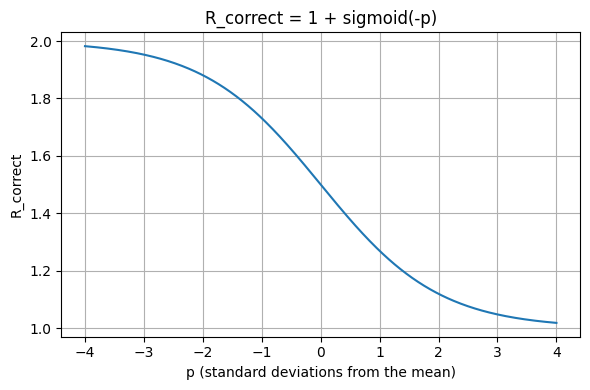

In [6]:
rho = np.linspace(-4, 4, 400)  # from -4σ to +4σ

R_correct = 1 + sigmoid(-rho)

plt.figure(figsize=(6, 4))
plt.plot(rho, R_correct)
plt.xlabel("p (standard deviations from the mean)")
plt.ylabel("R_correct")
plt.title("R_correct = 1 + sigmoid(-p)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [7]:
# Changing the group size
def split_into_chunks(groups, chunk_size):
    new_groups = []
    for group in groups:
        for i in range(0, len(group), chunk_size):
            chunk = group[i:i+chunk_size]
            if len(chunk) == chunk_size:   # keep only full chunks
                new_groups.append(chunk)
    return new_groups

In [8]:
# Testing different group sizes
def get_group_sizes(groups):
    sizes = [32, 16, 8, 4, 2]
    all_groups = [groups]

    for size in sizes[1:]:
        all_groups.append(split_into_chunks(groups, size))
    
    return all_groups

In [9]:
def get_group_rewards(groups):
    rewards = []

    for group in groups:
        group_reward = []

        # all inverse lengths, but keep track of correctness
        inv_lens = np.array([ans["length"] for ans in group], dtype=float)
        rights   = np.array([ans.get("right", False) for ans in group], dtype=bool)

        # restrict normalization to ONLY the correct answers
        group_lens_correct = inv_lens[rights]

        if len(group_lens_correct) < 2:
            # no or insufficient correct answers → reward 0 for incorrect, 1.5 for correct
            # OR just give 0 for all, depending on your desired fallback.
            # Here we follow your earlier logic: correct=1.5, incorrect=0.
            for r in rights:
                group_reward.append(1.5 if r else 0.0)
            continue

        # z-normalize correct answers
        mean = group_lens_correct.mean()
        std = group_lens_correct.std(ddof=1)

        if std == 0:
            # All correct answers have same length
            s_correct = np.ones_like(group_lens_correct) * 0.5
        else:
            z = (group_lens_correct - mean) / std
            s_correct = sigmoid(-z)

        # build full reward vector: correct=[1+s], incorrect=[0]
        idx_correct = 0
        for is_right in rights:
            if is_right:
                group_reward.append(1.0 + s_correct[idx_correct])
                idx_correct += 1
            else:
                group_reward.append(0.0)

        rewards.append(group_reward)

    return rewards


In [10]:
def get_group_advantages(all_group_rewards):
    all_advantages = []

    for group_rewards in all_group_rewards:  # each element is a list of reward lists
        group_advantages = []

        for rewards in group_rewards:        # rewards = list of floats for this group
            rewards = np.array(rewards, dtype=float)

            mean = rewards.mean()
            std = rewards.std(ddof=1)

            if std == 0:
                adv = np.zeros_like(rewards)
            else:
                adv = (rewards - mean) / std

            group_advantages.append(adv.tolist())

        all_advantages.append(group_advantages)

    return all_advantages


In [11]:
def reward_to_advantages(all_groups):
    all_rewards = []
    for cur_group in all_groups:
        all_rewards.append(get_group_rewards(cur_group))

    return get_group_advantages(all_rewards)

In [12]:
def combine_advantages(advantages):
    advantages_per_size = []

    for advantage in advantages:
        tmp_advantage = []

        for g in advantage:
            tmp_advantage.extend(g)

        advantages_per_size.append(tmp_advantage)

    return advantages_per_size

In [13]:
def perform_all_calcs(path):
    groups = get_groups(path)
    all_groups = get_group_sizes(groups)
    advantages = reward_to_advantages(all_groups)
    return combine_advantages(advantages)

In [14]:
path1 = r"C:/Users/nicho/OneDrive/Documents/Masters/Math DL/Project/Correct_ans_lens/single_pass/aime_single_0_12.json"
path2 = r"C:/Users/nicho/OneDrive/Documents/Masters/Math DL/Project/Correct_ans_lens/full_graph/aime_1_12.json"


adv1 = perform_all_calcs(path1)
adv2 = perform_all_calcs(path2)

[[{'length': 958, 'completion': 'To determine the time Aya spends walking and in the coffee shop, we start by setting up equations based on the given information.\n\nFirst, we know that when Aya walks at a speed of \\( s \\) km/h, it takes her 4 hours in total, including \\( t \\) minutes in the coffee shop. This means that the time spent walking is \\( 4 - \\frac{t}{60} \\) hours. Since the distance is 9 km, we can write the equation:\n\\[\n\\text{Time spent walking} = \\frac{9}{s} \\text{ hours}\n\\]\nSo,\n\\[\n\\frac{9}{s} = 4 - \\frac{t}{60}\n\\]\nMultiplying through by 60 to clear the fractions, we get:\n\\[\n540 = 240s - t \\quad \\text{(Equation 1)}\n\\]\n\nNext, we know that when Aya walks at a speed of \\( s+2 \\) km/h, it takes her 2 hours and 24 minutes, which is 2.4 hours in total, including \\( t \\) minutes in the coffee shop. This means that the time spent walking is \\( 2.4 - \\frac{t}{60} \\) hours. The distance is still 9 km, so we can write the equation:\n\\[\n\\text

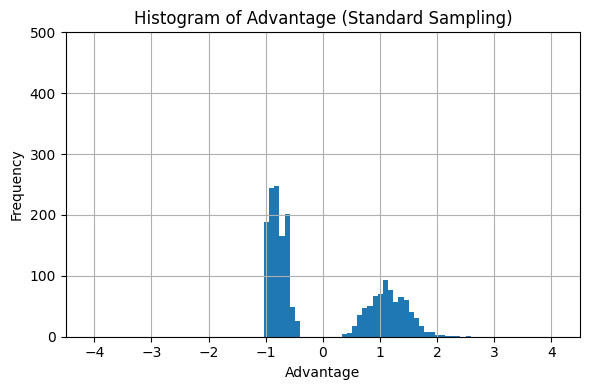

In [17]:
plt.figure(figsize=(6, 4))
plt.hist(adv1[0], bins=40)
plt.ylim(0, 500)
plt.xlim(-4.5, 4.5)
plt.xlabel("Advantage")
plt.ylabel("Frequency")
plt.title("Histogram of Advantage (Standard Sampling)")
plt.grid(True)
plt.tight_layout()
plt.show()

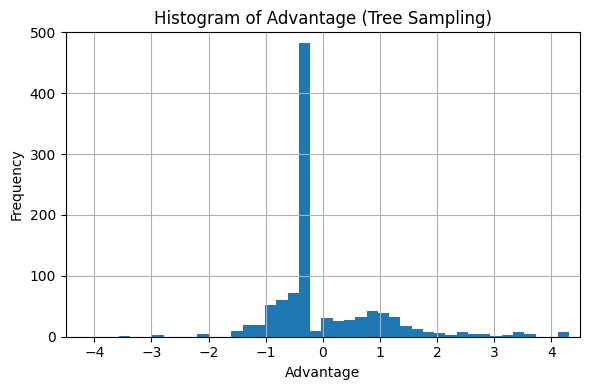

In [91]:
plt.figure(figsize=(6, 4))
plt.hist(adv2[0], bins=40)
plt.ylim(0, 500)
plt.xlim(-4.5, 4.5)
plt.xlabel("Advantage")
plt.ylabel("Frequency")
plt.title("Histogram of Advantage (Tree Sampling)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [18]:
stat, p = ks_2samp(adv1[0], adv2[0])
print(stat)
print(p)

0.37073416680979926
3.6307191475731286e-83
